# Multi-Class Dog Breed Clasification
This notebook builds a multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem definition
Identifying the breed of a dog given an image of a dog.

## 2. Data
The data is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features
Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

## Importing the tools

In [1]:
import tensorflow as tf
import tensorflow_hub as hub 
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available!


## Getting the data ready
Turning into Tensors (numerical representation)

In [2]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Breed Identification/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     9b43109fbcae180376e10ab60c522f48  scottish_deerhound
freq                                   1                 126


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


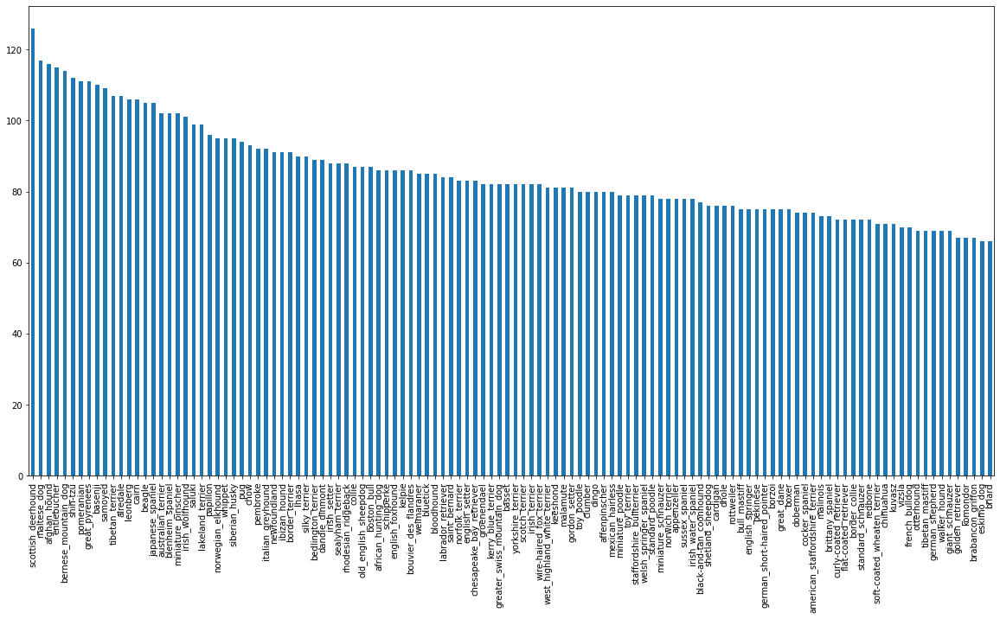

In [4]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20, 10));

In [5]:
# The median number of images per class
labels_csv["breed"].value_counts().median()

82.0

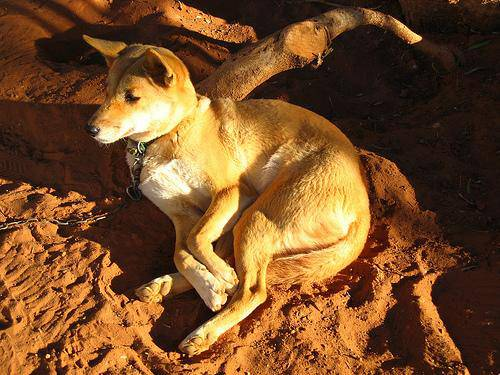

In [6]:
# View an image
from IPython.display import Image
Image("drive/MyDrive/Dog Breed Identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
# Create pathnames from image ID's
filenames = ["drive/MyDrive/Dog Breed Identification/train/" + fname + ".jpg" for fname in labels_csv["id"]]

# Check the first 10
filenames[:10]

['drive/MyDrive/Dog Breed Identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Breed Identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Breed Identification/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Breed Identification/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Breed Identification/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Breed Identification/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Breed Identification/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Breed Identification/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Breed Identification/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Breed Identification/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
# Check whether number of filenames matches number of actual image files
import os
print("Matches.") if len(os.listdir("drive/MyDrive/Dog Breed Identification/train")) == len(filenames) else print("Doesn't match.")

Matches.


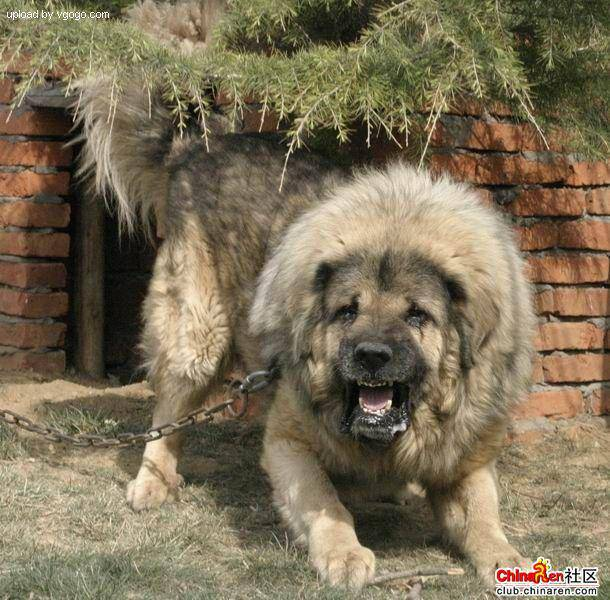

In [10]:
Image(filenames[9000])

In [11]:
# Prepare labels
import numpy as np
labels = np.array(labels_csv["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [12]:
# See if number of labels matches the number of filenames
print("Matches.") if len(labels) == len(filenames) else print("Doesn't match.")

Matches.


In [13]:
# Find the unique lables values
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [14]:
len(unique_breeds)

120

In [15]:
# Turn all labels into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [16]:
len(boolean_labels)

10222

### Creating validation set


In [17]:
# Setup X & y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images, and increase as needed.

In [18]:
# Set number of images for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}


In [19]:
# Split data into train and validation sets
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [20]:
X_train[:2], y_train[:2]

(['drive/MyDrive/Dog Breed Identification/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Breed Identification/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, Fal

### Preprocessing Images (turning into tensors)

To preprocess images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`
3. Turn `image` (a jpg) into Tensors
4. Normalize image (convert color channel values from from 0-255 to 0-1).
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

In [21]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 color channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to the desired value (224, 224)
  image = tf.image.resize(image, size=[img_size, img_size])
  return image

### Turning the data into batches

Why turn data into batches?
If we would try to process 10000+ images in one go, they all might simply not fit into memory.

So that's why we do 32 (the batch size) images at a time.

In order to use TensorFlow effectively, we need data in the form of Tensor tuples which look like this:
`(image, label)`.

In [22]:
# Function to return the needed tuple
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  return process_image(image_path), label

In [23]:
BATCH_SIZE = 32

# A function to turn the data into batches
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels)
  """
  # If the data is test dataset, we do not have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)

  # If the data is validation dataset, we do not need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    
  else:
    print("Creating training data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling data
    data = data.shuffle(buffer_size=len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  print("Success")
  return data_batch

In [24]:
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Success
Creating validation data batches...
Success


In [25]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches

In [26]:
import matplotlib.pyplot as plt

# A function for viewing images in a data batch
def show_15_images(images, labels):
  """
  Displays a plot of 15 images and their labels from a data batch
  """
  plt.figure(figsize=(10, 10))
  for i in range(15):
    ax = plt.subplot(5, 3, i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [27]:
train_images, train_labels = next(train_data.as_numpy_iterator())

In [28]:
len(train_images), len(train_labels)

(32, 32)

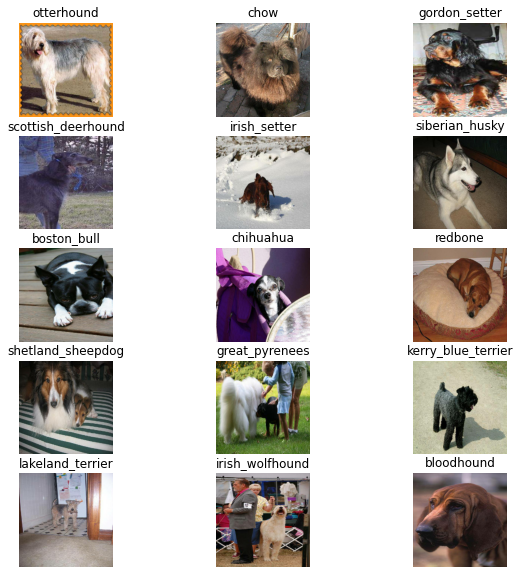

In [29]:
# Visualize data in the training batch
show_15_images(train_images, train_labels)

## Building a model

There are a few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* The output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [30]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, height, width, color channels

# Setup output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup a model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

We'll create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [31]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building a model with: ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [32]:
model = create_model()
model.summary()

Building a model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
keras_layer (KerasLayer)     (None, 1001)              5432713   
_________________________________________________________________
dense (Dense)                (None, 120)               120240    
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

### TensorBoard Callback

In [33]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [34]:
# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = "drive/MyDrive/Dog Breed Identification/logs/mobilenetv2-Adam-logs"
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.



In [35]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

## Training a model (on subset of data)

In [36]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [37]:
print("GPU", "available!" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available!


Create a function which trains a model.

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensorboard_callback()`
* Call the `fit()` function on model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callbacks
* Return the model

In [38]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and return a trained version.
  """
  # Create a model
  model = create_model()

  # Create a new TensorBoard session everytime a model is training
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  
  # Return the fitted model
  return model

In [39]:
# Fit the model to the data
model = train_model()

Building a model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 302s 11s/step - loss: 4.6004 - accuracy: 0.0887 - val_loss: 3.3685 - val_accuracy: 0.2600
Epoch 2/100
25/25 [==============================] - 4s 173ms/step - loss: 1.6524 - accuracy: 0.6800 - val_loss: 2.1359 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 4s 160ms/step - loss: 0.5782 - accuracy: 0.9350 - val_loss: 1.6476 - val_accuracy: 0.5850
Epoch 4/100
25/25 [==============================] - 4s 158ms/step - loss: 0.2634 - accuracy: 0.9800 - val_loss: 1.4766 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 4s 175ms/step - loss: 0.1540 - accuracy: 0.9987 - val_loss: 1.3898 - val_accuracy: 0.6450
Epoch 6/100
25/25 [==============================] - 4s 158ms/step - loss: 0.1043 - accuracy: 0.9987 - val_loss: 1.3460 - val_accuracy: 0.6500
Epoch 7/100
25/25 [===========================

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [40]:
%tensorboard --logdir drive/MyDrive/Dog\ Breed\ Identification/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [41]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 2s 118ms/step


array([[4.2070271e-03, 4.0274500e-04, 6.4140215e-04, ..., 2.2145378e-04,
        4.4893924e-05, 1.5741398e-03],
       [1.8072603e-03, 9.2640897e-04, 1.3633705e-02, ..., 2.5360548e-04,
        9.8457851e-04, 4.0709664e-04],
       [1.2318323e-04, 2.7609069e-04, 5.2019849e-04, ..., 9.7253465e-04,
        8.2875013e-05, 5.1385758e-04],
       ...,
       [3.4572147e-06, 6.1500614e-05, 8.1751306e-05, ..., 2.8494675e-05,
        5.0334980e-05, 4.9739756e-06],
       [4.5002974e-03, 9.9526973e-05, 3.9995144e-04, ..., 1.2703244e-04,
        3.7851639e-04, 4.3503761e-02],
       [7.0031511e-04, 2.2958321e-04, 6.7041628e-04, ..., 3.7484508e-02,
        8.9317985e-04, 1.8395983e-04]], dtype=float32)

In [42]:
predictions.shape

(200, 120)

In [43]:
# Turn prediction probabilties to their respective label
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label of the first element
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

In [44]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays of images and labels. 
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Сreate a function which:
* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. 
* Convert the prediction probabilities to a predicted label. 
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. 

In [45]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the colour of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"
  
  # Change plot title to be predicted, probability of prediction and truth label
  plt.title("Predicted: {} {:2.0f}%\nTrue: {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

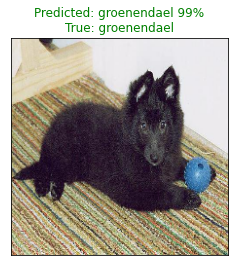

In [46]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

In [47]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  
  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")

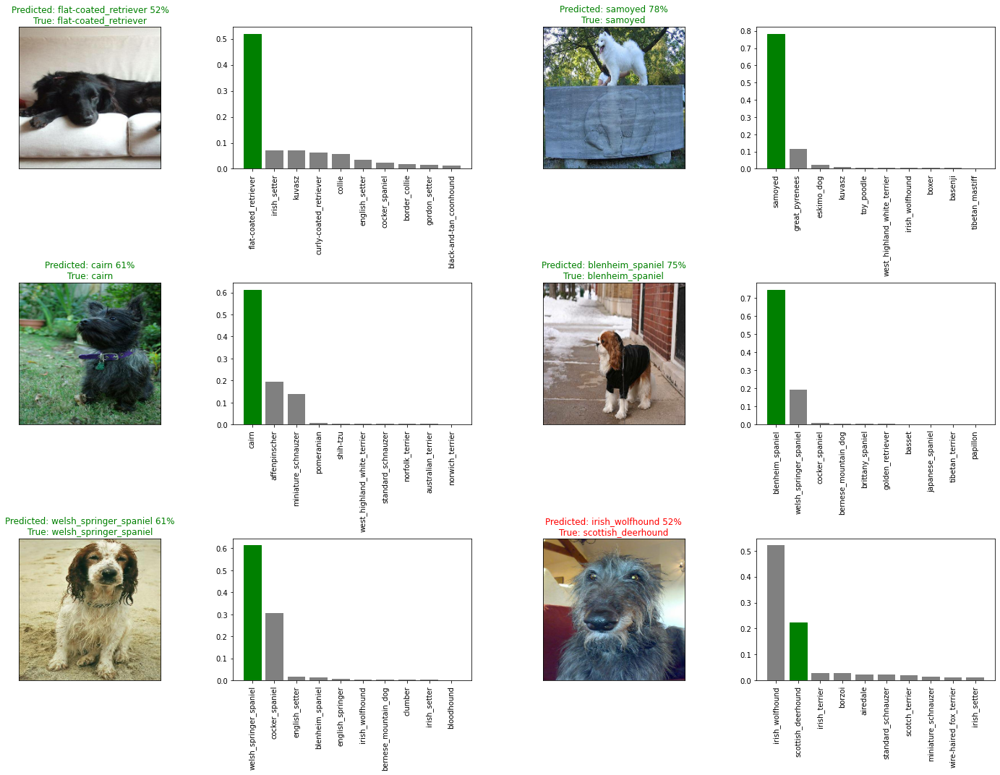

In [48]:
# Check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model

In [49]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname
  model_path = "drive/MyDrive/Dog Breed Identification/models/" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)

In [50]:
# Create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path, 
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [51]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Breed Identification/models/1000-images-mobilenetv2-Adam.h5...


In [52]:
# Load a trained model
loaded_1000_image_model = load_model('drive/MyDrive/Dog Breed Identification/models/1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Breed Identification/models/1000-images-mobilenetv2-Adam.h5


In [53]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 114ms/step - loss: 1.2768 - accuracy: 0.6500


[1.2767547369003296, 0.6499999761581421]

In [54]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 119ms/step - loss: 1.2768 - accuracy: 0.6500


[1.2767547369003296, 0.6499999761581421]

## Training a model on the full data

In [55]:
len(X), len(y)

(10222, 10222)

In [56]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches...
Success


In [57]:
full_data

<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.bool)>

In [58]:
# Create a model for full model
full_model = create_model()

Building a model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [59]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [60]:
# Fit the full model to the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2338s 7s/step - loss: 1.3489 - accuracy: 0.6666
Epoch 2/100
320/320 [==============================] - 39s 121ms/step - loss: 0.3966 - accuracy: 0.8858
Epoch 3/100
320/320 [==============================] - 39s 120ms/step - loss: 0.2381 - accuracy: 0.9362
Epoch 4/100
320/320 [==============================] - 39s 121ms/step - loss: 0.1532 - accuracy: 0.9632
Epoch 5/100
320/320 [==============================] - 39s 122ms/step - loss: 0.1063 - accuracy: 0.9791
Epoch 6/100
320/320 [==============================] - 38s 119ms/step - loss: 0.0788 - accuracy: 0.9847
Epoch 7/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0580 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0458 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 39s 122ms/step - loss: 0.0375 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 39s 121ms

In [61]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Breed Identification/models/full-image-set-mobilenetv2-Adam.h5...


In [62]:
# Load in the full model
loaded_full_model = load_model('drive/MyDrive/Dog Breed Identification/models/full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog Breed Identification/models/full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Since the model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

In [63]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Breed Identification/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Breed Identification/test/e6223aba45a94c9ac349967ed946d0f7.jpg',
 'drive/MyDrive/Dog Breed Identification/test/dfefaa03faeab447d6b48e7367255b43.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e6c9d8058cbc9b1665aecac1ae179288.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e1d31decdd6521df89e59d181f0c73ed.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e2976affb6d88a3e627ff8c31844f20a.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e48f3d4f0514a07f4777a30f01d32ea9.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e35bb9ec7ff4410f0fb097569af4e66a.jpg',
 'drive/MyDrive/Dog Breed Identification/test/de4223b8c5ca7b80d34d1cd2b5e62351.jpg',
 'drive/MyDrive/Dog Breed Identification/test/e4ec1e1a3e21d31f6e058c04655cb38b.jpg']

In [64]:
len(test_filenames)

10357

In [65]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...
Success


In [66]:
test_data

<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [67]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 3033s 9s/step


In [69]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt("drive/MyDrive/Dog Breed Identification/preds_array.csv", test_predictions, delimiter=",")

In [70]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt("drive/MyDrive/Dog Breed Identification/preds_array.csv", delimiter=",")

In [71]:
test_predictions[:10]

array([[6.54084204e-07, 7.00202054e-06, 9.01117687e-08, ...,
        8.24669542e-07, 2.31823205e-09, 3.56798004e-08],
       [9.73330305e-10, 2.71441671e-11, 3.42087383e-12, ...,
        2.68782236e-11, 3.88187339e-14, 2.01279832e-07],
       [2.17958362e-09, 4.18432023e-07, 1.85419724e-09, ...,
        1.22997371e-04, 2.82511290e-04, 2.73079461e-08],
       ...,
       [2.55676369e-10, 2.14735749e-08, 1.79323847e-10, ...,
        1.37424516e-09, 3.09136289e-12, 2.55728196e-07],
       [3.45386948e-11, 2.48120940e-10, 7.69938924e-06, ...,
        1.19664937e-05, 2.17609231e-05, 1.05928599e-11],
       [2.05779137e-15, 5.11855696e-08, 3.56239723e-13, ...,
        4.97213548e-10, 6.00464166e-12, 7.87695325e-15]])

In [72]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions for Kaggle

Looking at the Kaggle sample submission, we find that it wants our models prediction probaiblity outputs in a DataFrame with an ID and a column for each different dog breed.
https://www.kaggle.com/c/dog-breed-identification/overview/evaluation


In [73]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [74]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df["id"] = test_ids

In [75]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6223aba45a94c9ac349967ed946d0f7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dfefaa03faeab447d6b48e7367255b43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e2d65ef41ec9a649c8dbd92f0b821163,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e6c9d8058cbc9b1665aecac1ae179288,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1d31decdd6521df89e59d181f0c73ed,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [76]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,beagle,bedlington_terrier,bernese_mountain_dog,black-and-tan_coonhound,blenheim_spaniel,bloodhound,bluetick,border_collie,border_terrier,borzoi,boston_bull,bouvier_des_flandres,boxer,brabancon_griffon,briard,brittany_spaniel,bull_mastiff,cairn,cardigan,chesapeake_bay_retriever,chihuahua,chow,clumber,cocker_spaniel,collie,curly-coated_retriever,dandie_dinmont,dhole,dingo,doberman,...,norwegian_elkhound,norwich_terrier,old_english_sheepdog,otterhound,papillon,pekinese,pembroke,pomeranian,pug,redbone,rhodesian_ridgeback,rottweiler,saint_bernard,saluki,samoyed,schipperke,scotch_terrier,scottish_deerhound,sealyham_terrier,shetland_sheepdog,shih-tzu,siberian_husky,silky_terrier,soft-coated_wheaten_terrier,staffordshire_bullterrier,standard_poodle,standard_schnauzer,sussex_spaniel,tibetan_mastiff,tibetan_terrier,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e6223aba45a94c9ac349967ed946d0f7,6.54084e-07,7.00202e-06,9.01118e-08,2.90563e-09,4.67876e-08,9.11087e-09,4.83114e-07,3.26406e-08,9.43903e-10,4.56005e-10,5.22955e-08,1.55153e-07,3.27946e-08,2.40972e-08,2.56297e-08,1.42087e-08,5.73887e-07,4.56332e-10,1.31505e-07,1.31893e-07,1.69596e-06,1.91558e-10,4.24802e-08,2.46664e-07,2.03068e-08,4.85052e-07,4.9119e-07,1.32398e-08,1.44294e-08,3.50428e-09,2.42362e-08,9.06128e-07,1.94751e-08,4.11894e-07,4.9254e-08,4.08623e-08,3.85611e-09,9.54366e-08,1.61225e-07,...,2.55212e-08,1.97375e-08,1.10213e-06,1.10537e-06,3.68929e-07,2.47401e-06,3.78559e-09,1.15639e-08,1.66958e-08,2.57753e-08,1.20059e-05,1.04736e-07,2.96171e-07,8.53513e-08,9.54404e-08,6.50269e-07,4.23333e-07,3.97921e-05,6.87487e-07,2.79661e-09,4.5823e-08,2.99519e-09,1.94769e-06,5.96718e-07,4.86745e-08,1.45098e-07,7.98282e-08,2.02447e-06,8.15487e-07,0.000226817,2.20802e-08,2.49267e-09,1.8732e-09,2.14875e-08,4.36212e-06,3.39012e-07,5.04703e-09,8.2467e-07,2.31823e-09,3.56798e-08
1,dfefaa03faeab447d6b48e7367255b43,9.7333e-10,2.71442e-11,3.42087e-12,1.24367e-10,1.07589e-11,7.43956e-11,4.56516e-13,1.97911e-12,1.19338e-10,4.93893e-09,8.42422e-12,5.23887e-10,1.74537e-13,8.05412e-10,1.15128e-13,4.62765e-09,1.38019e-09,8.0526e-11,3.88779e-11,1.51723e-07,7.9922e-15,4.27549e-10,7.50635e-14,8.78241e-15,5.92279e-05,1.15651e-12,2.00514e-09,2.05911e-10,8.28995e-11,4.10555e-08,3.26052e-12,1.57865e-08,5.98697e-09,1.27097e-07,3.16221e-10,2.99244e-11,2.29412e-10,1.45793e-11,1.13871e-10,...,1.80207e-10,2.28982e-13,5.26464e-13,2.14726e-13,1.84515e-10,4.40366e-11,1.63108e-14,9.66873e-13,1.18028e-10,1.78584e-12,6.14701e-13,1.73141e-15,8.55159e-12,7.49315e-12,4.78352e-11,2.67666e-11,1.6014e-10,1.71968e-10,1.75621e-10,1.84833e-12,1.35198e-08,9.90788e-12,2.70154e-10,8.00457e-12,2.85506e-07,1.26289e-08,1.42563e-11,8.70462e-09,1.18729e-12,9.04154e-12,4.86608e-09,6.20249e-11,2.44436e-09,8.69451e-09,6.69478e-12,7.92113e-07,3.43405e-09,2.68782e-11,3.88187e-14,2.0128e-07
2,e2d65ef41ec9a649c8dbd92f0b821163,2.17958e-09,4.18432e-07,1.8542e-09,4.94098e-07,3.11873e-07,9.1653e-08,1.13802e-05,1.75837e-10,3.56477e-09,5.20743e-11,0.912766,1.2859e-07,1.14976e-06,2.9308e-07,1.51809e-12,7.23115e-09,8.40223e-12,1.60643e-08,5.84532e-06,1.22772e-09,5.1873e-11,9.00019e-08,5.41045e-09,5.86802e-07,1.76048e-08,3.49411e-10,9.92309e-11,5.86574e-11,9.74566e-06,1.45567e-07,4.29285e-11,8.20439e-07,4.873e-07,2.70059e-07,5.99674e-05,8.68199e-06,1.18667e-11,1.21504e-09,6.38641e-07,...,3.49465e-08,2.13727e-12,6.78162e-05,5.62467e-09,2.85427e-08,1.00519e-08,2.14237e-10,1.42869e-09,2.13923e-07,1.36156e-06,1.83248e-06,3.02665e-08,1.10104e-10,1.1568e-05,8.91893e-06,2.3117e-10,2.87132e-07,1.55681e-05,0.00309173,2.1778e-09,3.35065e-09,7.4528e-09,6.05543e-09,6.41305e-05,3.31358e-08,7.78469e-07,1.55556e-07,1.12046e-09,2.79518e-09,9.529e-10,0.02637,2.35881e-06,1.78226e-07,3.55382e-07,2.18847e-06,3.86086e-07,3.46327e-

In [77]:
# Save predictions dataframe to CSV for submission to Kaggle
preds_df.to_csv("drive/My Drive/Dog Breed Identification/full_model_predictions_submission_mobilenetV2.csv",
                index=False)

## Making predictions on custom images

In [78]:
# Get custom image filepaths
custom_path = "drive/MyDrive/Dog Breed Identification/custom-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [79]:
custom_image_paths

['drive/MyDrive/Dog Breed Identification/custom-dog-photos/photo_2021-08-30 22.48.56.jpeg',
 'drive/MyDrive/Dog Breed Identification/custom-dog-photos/photo_2021-08-30 22.49.00.jpeg',
 'drive/MyDrive/Dog Breed Identification/custom-dog-photos/photo_2021-08-30 22.49.03.jpeg']

In [80]:
# Turn custom images into batch datasets 
custom_data = create_data_batches(custom_image_paths, test_data=True)
custom_data

Creating test data batches...
Success


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

In [81]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

In [82]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['chihuahua', 'american_staffordshire_terrier', 'chihuahua']

In [83]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

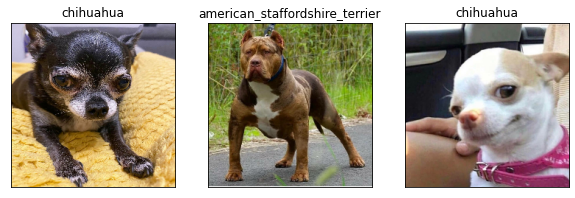

In [84]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)